In [1]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
# import seaborn as sns 
import datetime
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly.graph_objs import Scatter, Figure, Layout
import plotly
import plotly.graph_objs as go
import plotly.express as px
from IPython.display import Markdown as md
init_notebook_mode(connected=False)
import io
import requests
import re

## COVID-19 in Italy. Visuals

___


##### *(alternatively, see results and code together [here](https://random-r.github.io/Italy_ipynb.html))*
&nbsp;

___

#### Data source: [this GitHubi page](https://github.com/pcm-dpc/COVID-19)

> __Authors and sources mentioned__: Editore/Autore del dataset: Dipartimento della Protezione Civile. Categoria ISO 19115: Salute. Dati forniti dal Ministero della Salute.

>> ##### __Regional data files__ (_Dati per Regione_):
>>  * Struttura file giornaliero: dpc-covid19-ita-regioni-yyyymmdd.csv (dpc-covid19-ita-regioni-20200224.csv)
>>  * File complessivo: dpc-covid19-ita-regioni.csv
>>  * File ultimi dati (latest): dpc-covid19-ita-regioni-latest.csv

&nbsp;

* Below we use the 'dpc-covid19-ita-regioni.csv' file (updated on daily basis, so far). 

* In addition, we get __regional population size__ from https://it.wikipedia.org/wiki/Regione_(Italia) for per capita measures

In [2]:
URL='https://it.wikipedia.org/wiki/Regione_(Italia)'
res=requests.get(URL)
tables=pd.read_html(res.text)
dt = tables[13]

In [3]:
def dewhite(x):
    ''.join(re.findall('\d+', x))

dt2 = dt[['Regione','Popolazione (ab.)']].copy()
dt2.columns = ['Region','Pop']
    
dt2.Pop = dt2.Pop.apply(lambda x: ''.join(re.findall('\d+', x))).astype(int)

In [4]:
s = requests.get("https://raw.githubusercontent.com/pcm-dpc/COVID-19/master/dati-regioni/dpc-covid19-ita-regioni.csv").content
dat = pd.read_csv(io.StringIO(s.decode('utf-8')))
cdate = dat.data.max()

md("Currently data as of date: {}".format(cdate))

Currently data as of date: 2020-11-15T17:00:00

___
&nbsp;

#### What's in the original dataframe?

In [5]:
md("All column names: {}".format(dat.columns.tolist()))

All column names: ['data', 'stato', 'codice_regione', 'denominazione_regione', 'lat', 'long', 'ricoverati_con_sintomi', 'terapia_intensiva', 'totale_ospedalizzati', 'isolamento_domiciliare', 'totale_positivi', 'variazione_totale_positivi', 'nuovi_positivi', 'dimessi_guariti', 'deceduti', 'casi_da_sospetto_diagnostico', 'casi_da_screening', 'totale_casi', 'tamponi', 'casi_testati', 'note']

In [6]:
df = dat.drop(['stato','codice_regione'], axis=1)
df.columns = ['Date','Region','Lat','Long','HospWithSymptoms','IC','HospTotal','AtHome','CurrentlyPositive','VariationOfPositives','NewPositives','Recovered', 'Deaths','Diagnostico','Screening','TotalCases','NoOfTests','casi_testati','note']

df = pd.merge(df, dt2, left_on='Region', right_on='Region')

df['Date'] = pd.to_datetime(df['Date']).dt.date
df = df.set_index(df["Date"])
df.index = pd.to_datetime(df.index)

df['NewPositives'] = np.abs(df['NewPositives'])

dat.tail(5)

,data,stato,codice_regione,denominazione_regione,lat,long,ricoverati_con_sintomi,terapia_intensiva,totale_ospedalizzati,isolamento_domiciliare,...,variazione_totale_positivi,nuovi_positivi,dimessi_guariti,deceduti,casi_da_sospetto_diagnostico,casi_da_screening,totale_casi,tamponi,casi_testati,note
5581,2020-11-15T17:00:00,ITA,19,Sicilia,38.115697,13.362357,1476,217,1693,27114,...,1001,1422,11829,896,25806.0,15726.0,41532,816609,565253.0,NaN
5582,2020-11-15T17:00:00,ITA,9,Toscana,43.769231,11.255889,1734,274,2008,50300,...,1247,2653,25216,1879,63548.0,15855.0,79403,1331924,856660.0,NaN
5583,2020-11-15T17:00:00,ITA,10,Umbria,43.106758,12.388247,366,71,437,10658,...,319,657,7528,253,5315.0,13561.0,18876,360719,203439.0,Si fa presente come nel computo dei ricoverati...
5584,2020-11-15T17:00:00,ITA,2,Valle d'Aosta,45.737503,7.320149,148,12,160,2135,...,-4,143,2703,248,4641.0,605.0,5246,50230,29683.0,NaN
5585,2020-11-15T17:00:00,ITA,5,Veneto,45.434905,12.338452,1934,241,2175,59331,...,1801,2792,36525,2845,27442.0,73434.0,100876,2562531,989643.0,Tamponi antigenici 588.190


___

&nbsp;

#### Variable names to English and their explanation
  * HospWithSymptoms : _Currently hospitalized patients with symptoms_
  * IC : _Intensive care_
  * HospTotal: _Total number of currently hospitalized patients_
  * AtHome : _Currently at home confinement_
  * CurrentlyPositive : _Total amount of current positive cases (Hospitalised patients + Home confinement)_
  * NewPositives : _New amount of positive cases (Actual total amount of current positive cases - total amount of current positive cases of the previous day)_
  * TotalCases : _Total amount of positive cases_
  * NoOfTests : _Tests performed_

In [7]:
df.tail()

,Date,Region,Lat,Long,HospWithSymptoms,IC,HospTotal,AtHome,CurrentlyPositive,VariationOfPositives,NewPositives,Recovered,Deaths,Diagnostico,Screening,TotalCases,NoOfTests,casi_testati,note,Pop
Date,,,,,,,,,,,,,,,,,,,,
2020-11-11,2020-11-11,Veneto,45.434905,12.338452,1669,208,1877,50358,52235,1985,3082,32413,2689,26526.0,60811.0,87337,2494150,965761.0,tamponi antigenici 492.456,4905854
2020-11-12,2020-11-12,Veneto,45.434905,12.338452,1763,213,1976,52779,54755,2520,3564,33419,2727,26696.0,64205.0,90901,2511361,971907.0,Tamponi antigenici 519.458,4905854
2020-11-13,2020-11-13,Veneto,45.434905,12.338452,1831,219,2050,55238,57288,2533,3605,34454,2764,26878.0,67628.0,94506,2529005,978328.0,Tamponi antigenici 543.099,4905854
2020-11-14,2020-11-14,Veneto,45.434905,12.338452,1869,228,2097,57608,59705,2417,3578,35563,2816,27166.0,70918.0,98084,2547409,984607.0,Tamponi antigenici 577.984,4905854
2020-11-15,2020-11-15,Veneto,45.434905,12.338452,1934,241,2175,59331,61506,1801,2792,36525,2845,27442.0,73434.0,100876,2562531,989643.0,Tamponi antigenici 588.190,4905854


___

&nbsp;

## Regional trends
#### daily numbers & moving averages (MA)
#### (double click and click on legend to select one or multiple regions in the graph)

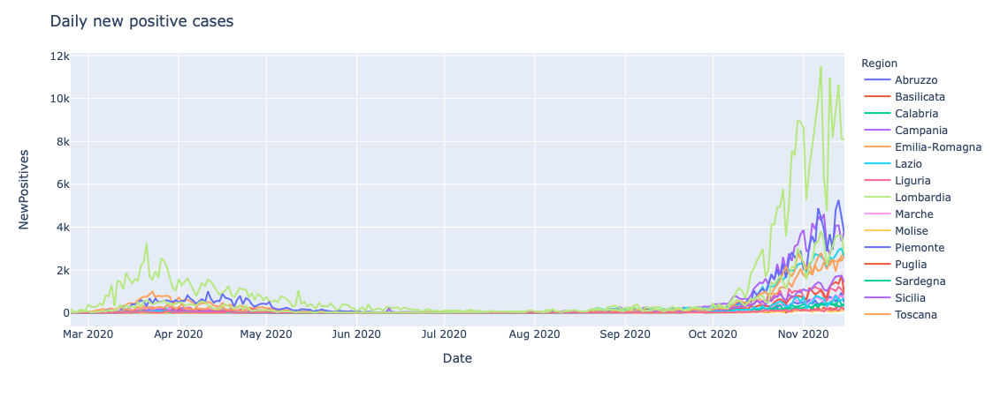

In [8]:
df2 = df

fig = px.line(df2, x="Date", y="NewPositives", color="Region", hover_name="Region",
        render_mode="svg", log_y=False)
fig.update_layout(title="Daily new positive cases")
fig.show()

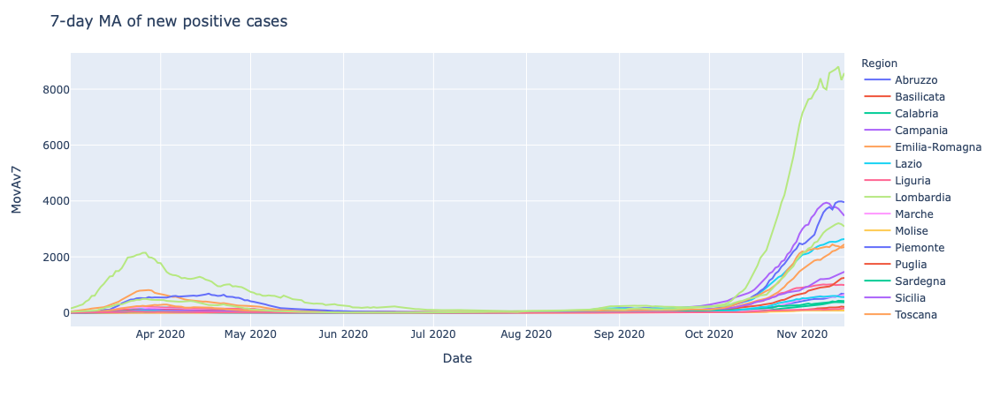

In [9]:
df2['MovAv7'] = df2['NewPositives'].rolling(window=7).mean()

fig = px.line(df2[df2.index>'2020-3-1'], x="Date", y="MovAv7", color="Region", hover_name="Region",
        render_mode="svg", log_y=False)
fig.update_layout(title="7-day MA of new positive cases")
fig.show()

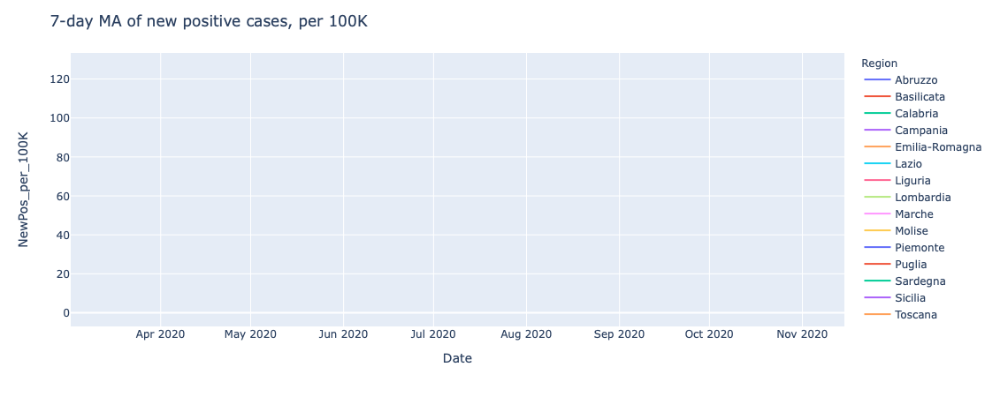

In [10]:
df2['NewPos_per_100K'] = df2['NewPositives']/df2['Pop']*1000_00

df2['NewPos_per_100K'] = df2['NewPos_per_100K'].rolling(window=7).mean()

fig = px.line(df2[df2.index>'2020-3-1'], x="Date", y="NewPos_per_100K", color="Region", 
              hover_name="Region", log_y=False)
fig.update_layout(title="7-day MA of new positive cases, per 100K")
fig.show()

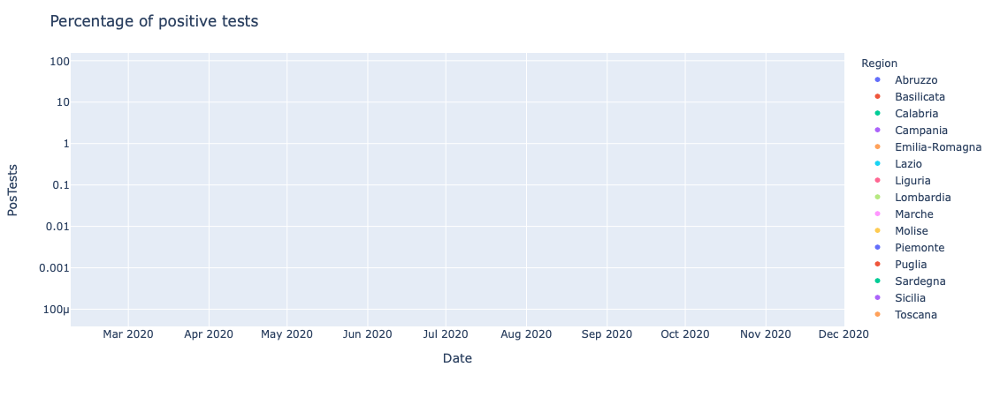

In [11]:
df2['PosTests'] = df2['NewPositives']/df2['NoOfTests']*100

fig = px.scatter(df2, y="PosTests", x="Date", color="Region", 
              hover_name="Region", log_y=True)
fig.update_layout(title="Percentage of positive tests")
fig.show()

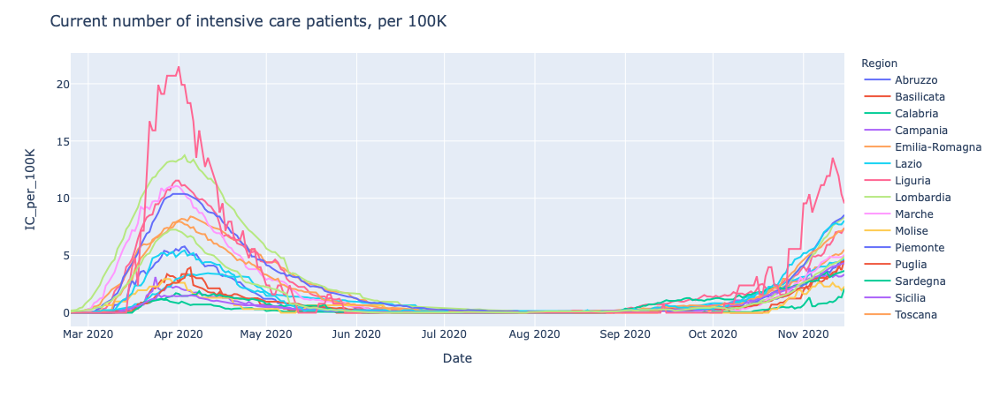

In [12]:
df2['IC_per_100K'] = df2['IC']/df2['Pop']*1000_00

fig = px.line(df2, x="Date", y="IC_per_100K", color="Region", hover_name="Region",
        render_mode="svg", log_y=False)
fig.update_layout(title="Current number of intensive care patients, per 100K")
fig.show()

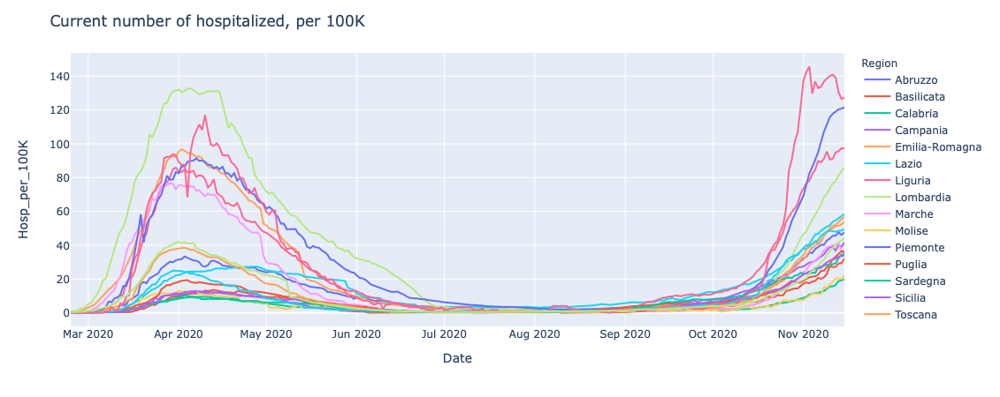

In [13]:
df2['Hosp_per_100K'] = df2['HospTotal']/df2['Pop']*1000_00

fig = px.line(df2, x="Date", y="Hosp_per_100K", color="Region", hover_name="Region",
        render_mode="svg", log_y=False)
fig.update_layout(title="Current number of hospitalized, per 100K")
fig.show()

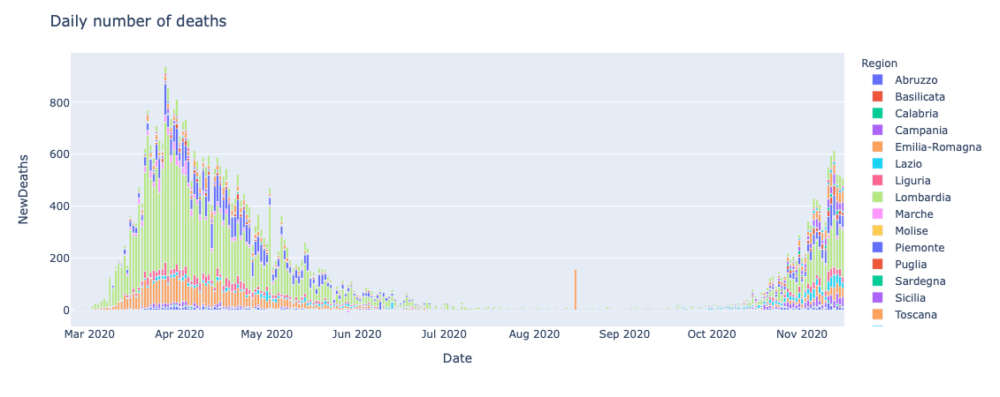

In [14]:
df3 = df2.copy()

df3['NewDeaths'] = df3['Deaths'] - df3.groupby(['Region'])['Deaths'].transform('shift')

fig = px.bar(df3, x=df3['Date'], y="NewDeaths", color="Region", hover_name="Date")
fig.update_layout(title="Daily number of deaths")
fig.show()

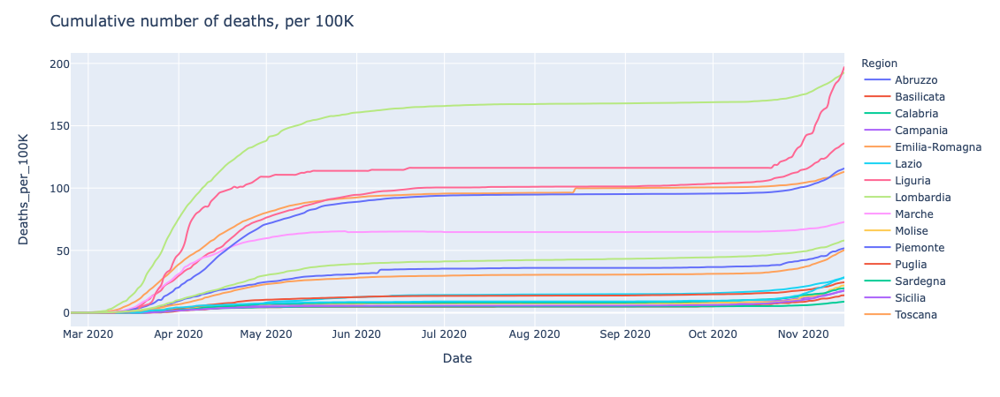

In [15]:
df2['Deaths_per_100K'] = (df2['Deaths']/df2['Pop'])*1000_00
fig = px.line(df2, x="Date", y="Deaths_per_100K", color="Region", 
              hover_name="Region", render_mode="svg", line_shape='spline')
fig.update_layout(title="Cumulative number of deaths, per 100K")
fig.show()

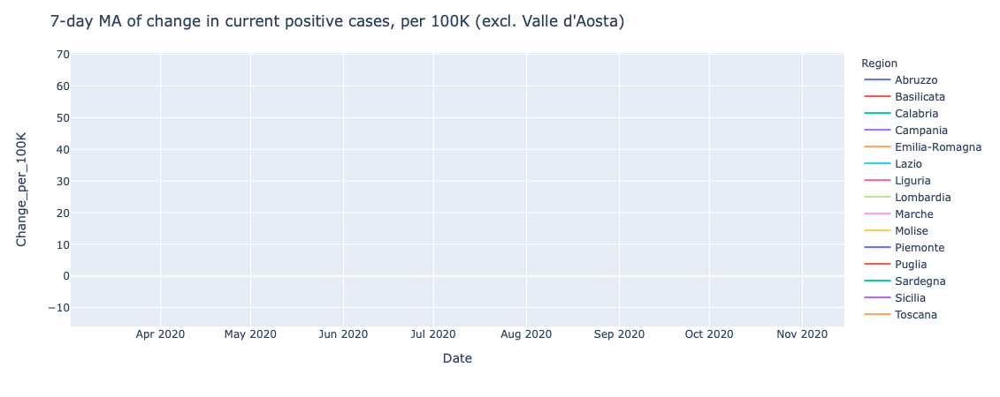

In [16]:
df2['Change_per_100K'] = df2['VariationOfPositives']/df2['Pop']*1000_00
df2['Change_per_100K'] = df2['Change_per_100K'].rolling(window=7).mean()

fig = px.line(df2[(df2.index>'2020-3-1') & (df2['Region']!="""Valle d'Aosta""")], x='Date', y="Change_per_100K", 
              color="Region", hover_name="Date")
fig.update_layout(title="7-day MA of change in current positive cases, per 100K (excl. Valle d'Aosta)")
fig.show()

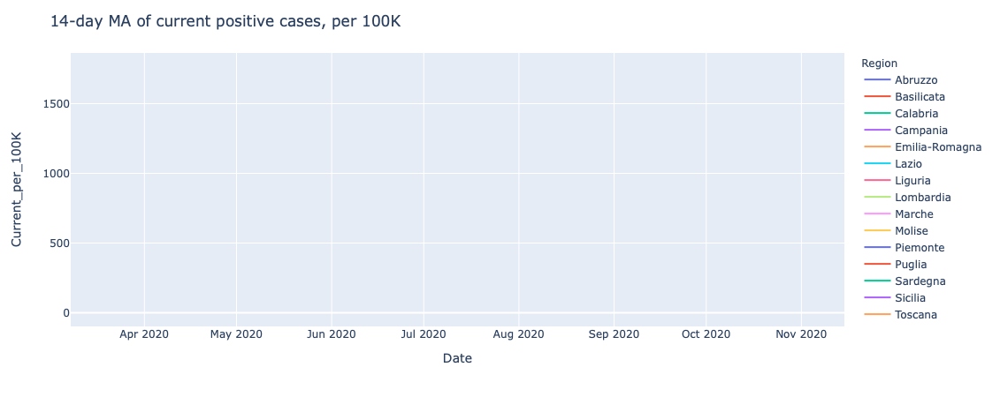

In [17]:
df2['Current_per_100K'] = df2['CurrentlyPositive']/df2['Pop']*1000_00
df2['Current_per_100K'] = df2['Current_per_100K'].rolling(window=14).mean()

fig = px.line(df2[(df2.index>'2020-3-7')], x='Date', y="Current_per_100K", color="Region", hover_name="Date")
fig.update_layout(title="14-day MA of current positive cases, per 100K")
fig.show()

___

&nbsp;

## All regions together

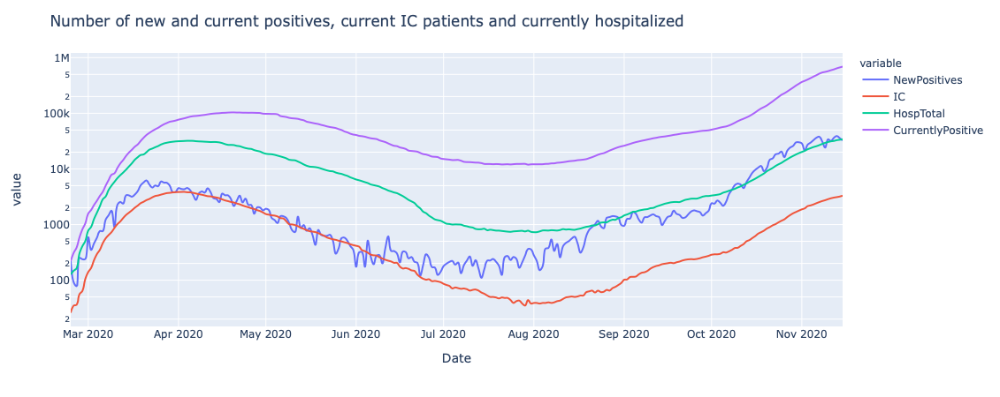

In [18]:
df2 = df
df_sum = df2.drop(['Lat','Long'], axis=1).groupby(df.Date).sum().reset_index()

df_sum2 = pd.melt(df_sum, id_vars=['Date'], value_vars=['NewPositives','IC','HospTotal','CurrentlyPositive'])

fig = px.line(df_sum2, x="Date", y="value", color='variable', hover_name="value", render_mode="svg", log_y=True, 
              line_shape='spline')
fig.update_layout(title="Number of new and current positives, current IC patients and currently hospitalized")
fig.show()